In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
train_images = 'drive/My Drive/datasets/caltech-101'

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1. / 255,
                                   rotation_range = 45,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   width_shift_range = 0.1,
                                   height_shift_range = 0.1
                                   )

In [ ]:
train_set = train_datagen.flow_from_directory(train_images,
                                              target_size = (100, 100),
                                              batch_size = 100,
                                              class_mode = 'categorical'
                                             )


Found 9144 images belonging to 102 classes.


In [ ]:
print("Number of Training Samples :", train_set.samples)
print("Batches size :", train_set.batch_size)

Number of Training Samples : 9144
Batches size : 100


In [ ]:
class_labels = train_set.class_indices
class_names = list(class_labels.keys())
#print(type(classes))
print("No of classes: ", len(class_names))
print()
print(class_names)

No of classes:  102

['BACKGROUND_Google', 'Faces', 'Faces_easy', 'Leopards', 'Motorbikes', 'accordion', 'airplanes', 'anchor', 'ant', 'barrel', 'bass', 'beaver', 'binocular', 'bonsai', 'brain', 'brontosaurus', 'buddha', 'butterfly', 'camera', 'cannon', 'car_side', 'ceiling_fan', 'cellphone', 'chair', 'chandelier', 'cougar_body', 'cougar_face', 'crab', 'crayfish', 'crocodile', 'crocodile_head', 'cup', 'dalmatian', 'dollar_bill', 'dolphin', 'dragonfly', 'electric_guitar', 'elephant', 'emu', 'euphonium', 'ewer', 'ferry', 'flamingo', 'flamingo_head', 'garfield', 'gerenuk', 'gramophone', 'grand_piano', 'hawksbill', 'headphone', 'hedgehog', 'helicopter', 'ibis', 'inline_skate', 'joshua_tree', 'kangaroo', 'ketch', 'lamp', 'laptop', 'llama', 'lobster', 'lotus', 'mandolin', 'mayfly', 'menorah', 'metronome', 'minaret', 'nautilus', 'octopus', 'okapi', 'pagoda', 'panda', 'pigeon', 'pizza', 'platypus', 'pyramid', 'revolver', 'rhino', 'rooster', 'saxophone', 'schooner', 'scissors', 'scorpion', 'sea

In [ ]:
dataiter = iter(train_set)
x_test , y_test = next(dataiter)

In [ ]:
print(len(x_test))
print(len(y_test))

100
100


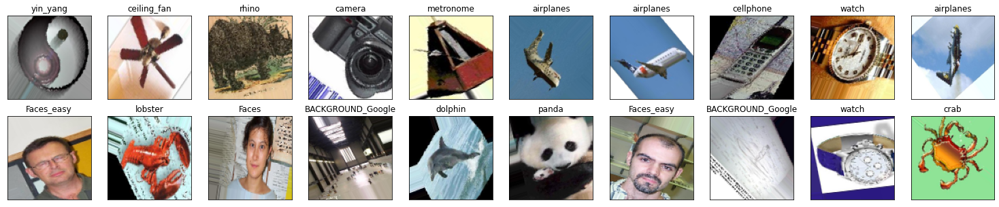

In [ ]:
fig = plt.figure(figsize = (26, 5))

for idx in np.arange(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(x_test[idx])
  plt.title(class_names[np.argmax(y_test[idx])])

In [ ]:
input_shape = Input(shape = x_test[0].shape)
input_shape

<tf.Tensor 'input_2:0' shape=(None, 100, 100, 3) dtype=float32>

In [ ]:
'''
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size = (3, 3), activation = 'relu',input_shape = (100, 100, 3), padding = 'same'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 32, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))


model.add(Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(filters = 512, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(Conv2D(filters = 512, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(units = 1024, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(units = 102, activation = 'softmax'))



print(model.summary())

'''

In [ ]:
#model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
'''
history = model.fit_generator(train_set,
                              steps_per_epoch = 9144,
                              epochs = 5
                              )
                                 '''                        

In [ ]:
#model.save("drive/My Drive/CNN Models/Adversrial Patch Solution/caltech101.h5")

In [ ]:
# load the saved model
from tensorflow.keras.models import load_model
model = load_model("drive/My Drive/CNN Models/Adversrial Patch Solution/caltech101.h5")

In [ ]:
# accuracy and loss of model on test data
loss, accuracy = model.evaluate(x_test, y_test)
print()
print("Model Accuracy on test images: ", round(accuracy * 100, 2), "%")
print("Model Loss on test images: ", round(loss, 2))

4/4 [==============================] - 0s 63ms/step - loss: 0.0062 - accuracy: 1.0000

Model Accuracy on test images:  100.0 %
Model Loss on test images:  0.01


**Adversrial Attacks**

In [ ]:
#!pip install foolbox==2.4.0
import foolbox

In [ ]:
pred = model.predict(x_test[15].reshape(1, 100, 100, 3))
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))
y_pred = np.argmax(pred)
l = y_pred.reshape(1)


# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.FGSM(model = fmodel, criterion = c, distance = d)


adv_img = attack(inputs = x_test[15].reshape(1, 100, 100, 3), labels = l)
adv_diff = adv_img - x_test[15]

In [ ]:
adv_pred = model.predict(adv_img)
y_adv_pred = np.argmax(adv_pred)
y_adv_pred 

85

In [ ]:
# reconstruction
adv_recons = x_test[15] + 0.003 * adv_img
pred_recons = model.predict(adv_recons)
y_pred_recons = np.argmax(pred_recons)

([], <a list of 0 Text major ticklabel objects>)

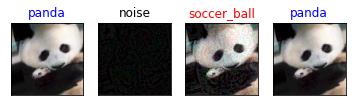

In [ ]:
plt.subplot(1, 4, 1)
plt.imshow(x_test[15])
plt.title(class_names[y_pred], color = 'blue')
plt.xticks([])
plt.yticks([])


plt.subplot(1, 4, 2)
plt.imshow(np.clip(adv_diff.reshape(100, 100, 3), 0, 1))
plt.title('noise')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 4, 3)
plt.imshow(np.clip(adv_img.reshape(100, 100, 3), 0, 1))
plt.title(class_names[y_adv_pred], color = 'red')
plt.xticks([])
plt.yticks([])

plt.subplot(1, 4, 4)
plt.imshow(np.clip(adv_recons.reshape(100, 100, 3), 0, 1))
plt.title(class_names[y_pred_recons], color = 'blue')
plt.xticks([])
plt.yticks([])

## 1. Fast Gradient Sign Attack and Reconstruction of Adversarial Example

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.FGSM(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []
adv_difference = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  adv_diff = adv - x_test[idx]
  adv_difference.append(adv_diff)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)




In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)
adv_difference = np.asarray(adv_difference)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 10ms/step - loss: 5.4161 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  5.42


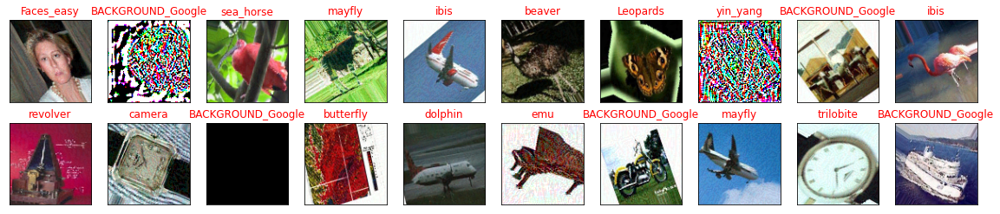

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

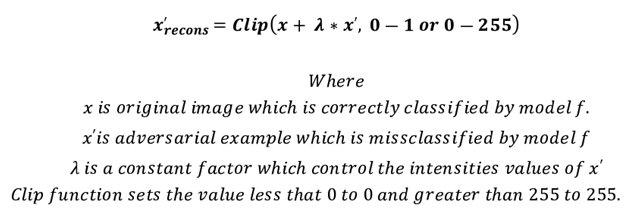

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.9907 - accuracy: 0.9500


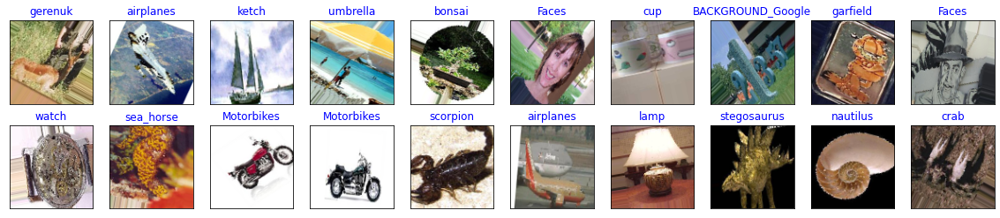

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

# 2. Basic Iterative Method (Attack) and Reconstruction of Adversarial Examples 

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.BIM(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 7ms/step - loss: 1.7473 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  1.75


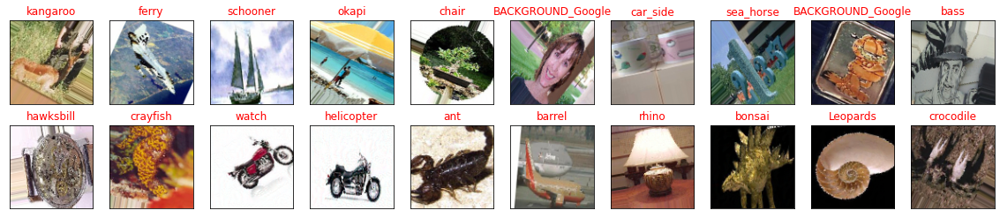

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

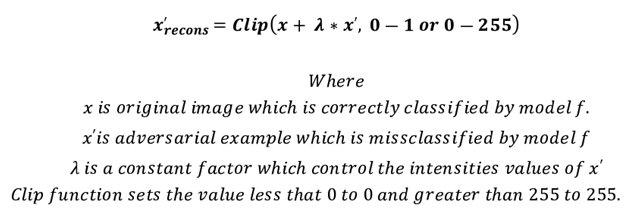

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 8ms/step - loss: 0.9921 - accuracy: 0.9500


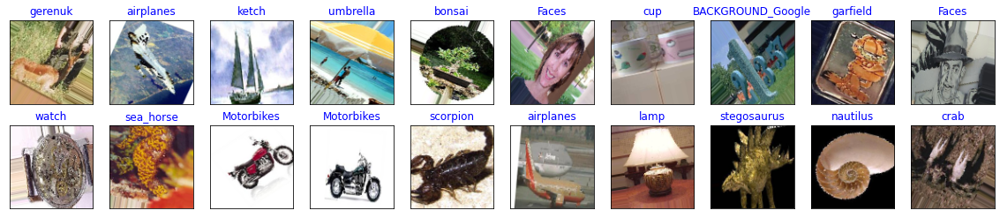

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#Projected Gradient Descent Attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.PGD(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 7ms/step - loss: 1.7052 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  1.71


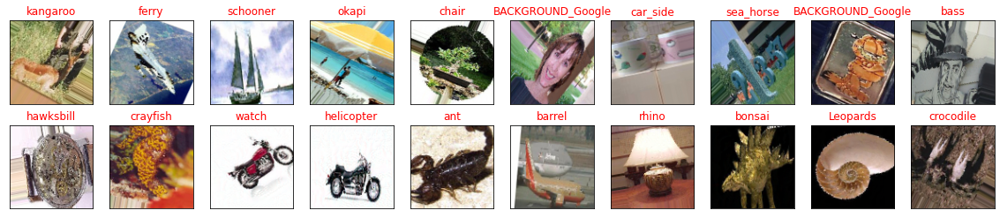

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

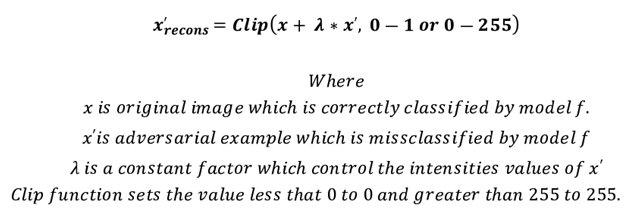

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 7ms/step - loss: 0.9921 - accuracy: 0.9500


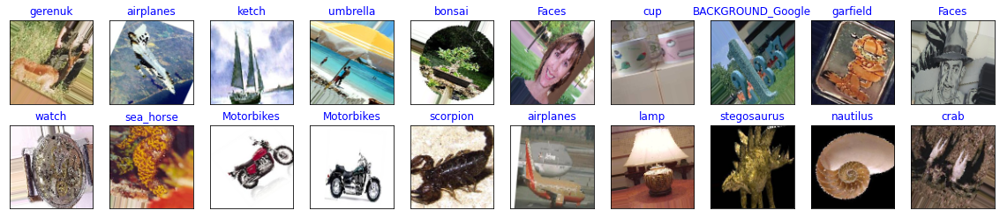

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#Momentum Iterative Attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.MomentumIterativeAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 7ms/step - loss: 1.7528 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  1.75


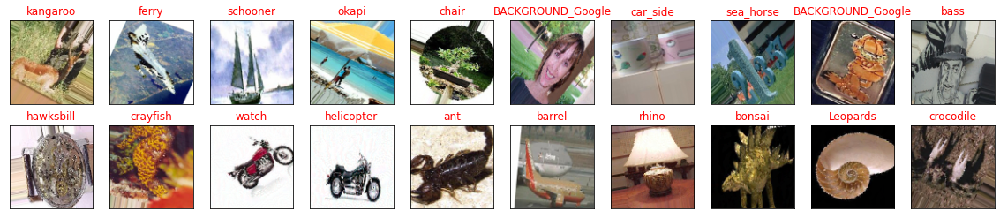

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

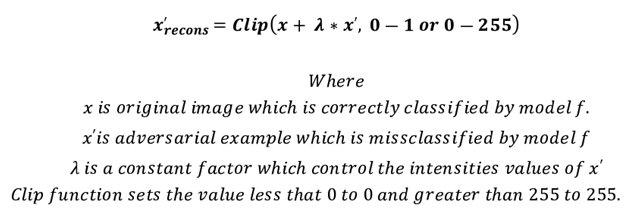

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.9920 - accuracy: 0.9500


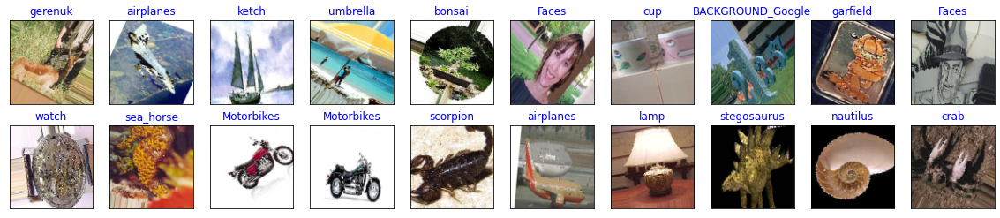

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#Deep Fool Attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.DeepFoolAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 6ms/step - loss: 3860.5125 - accuracy: 0.0200

Model accuraccy on Adversarial Example:  0.02 %
Model loss on Adversarial Example:  3860.51


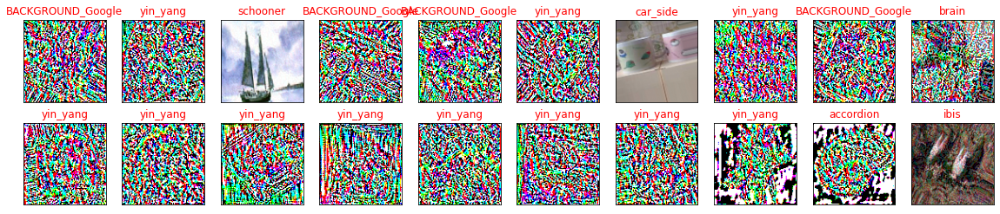

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

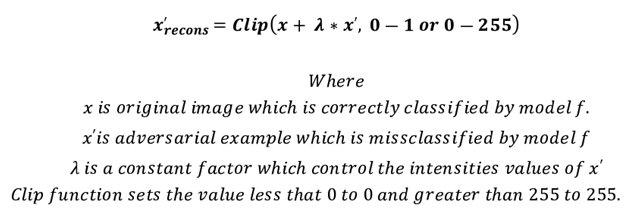

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 22.6893 - accuracy: 0.1600


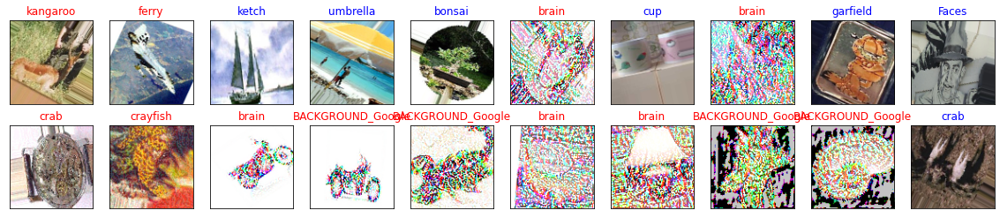

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#Newton Fool Attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.NewtonFoolAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 6ms/step - loss: 5.0343 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  5.03


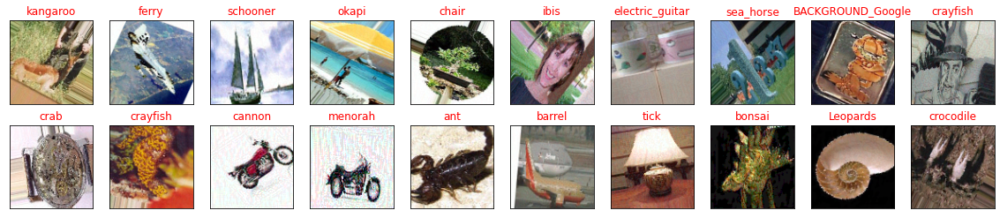

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

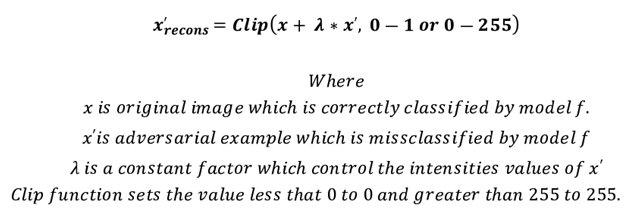

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.9907 - accuracy: 0.9500


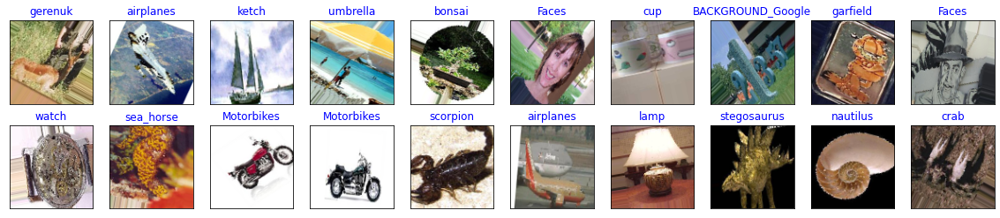

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#A Def Attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.ADefAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 6ms/step - loss: 5.0343 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  5.03


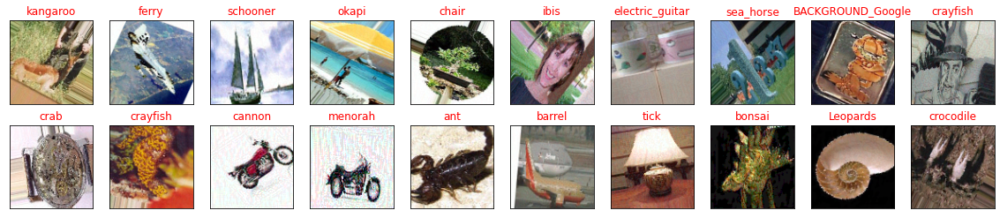

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

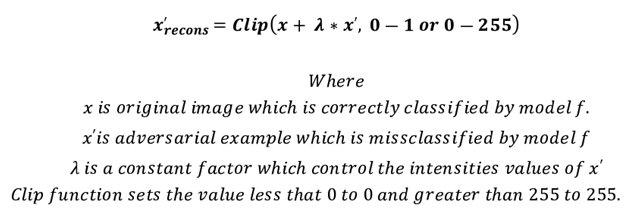

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.9907 - accuracy: 0.9500


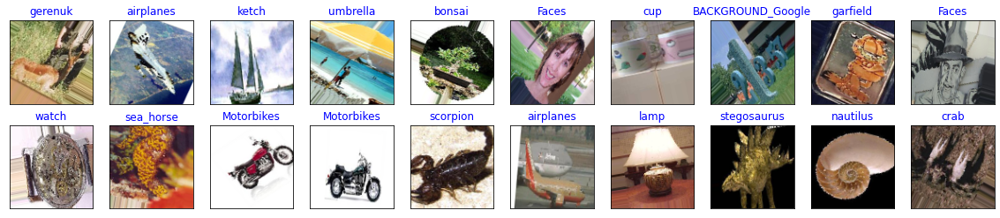

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#Saliency Map Attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.SaliencyMapAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 7ms/step - loss: 1.7992 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  1.8


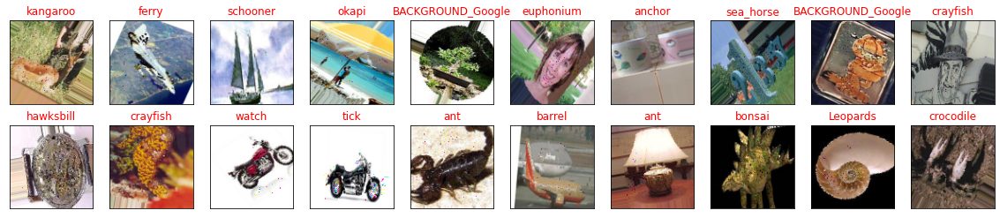

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

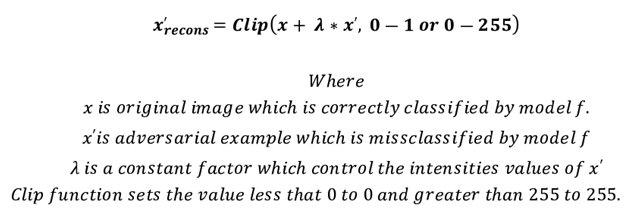

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.9920 - accuracy: 0.9500


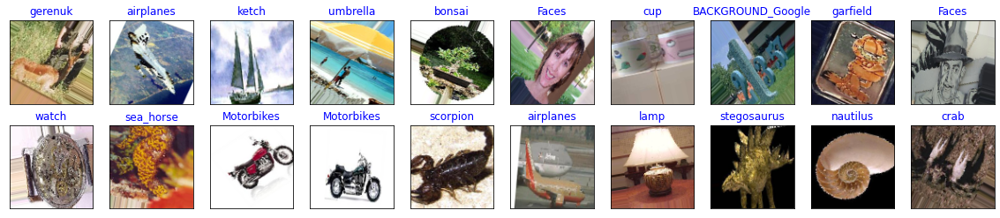

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

#Carlini & Wagner attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.CarliniWagnerL2Attack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 7ms/step - loss: 11.8233 - accuracy: 0.0100

Model accuraccy on Adversarial Example:  0.01 %
Model loss on Adversarial Example:  11.82


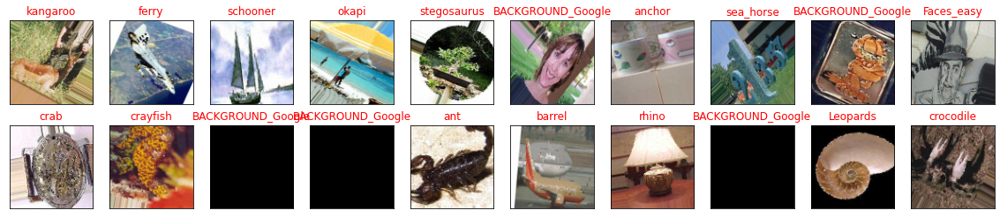

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

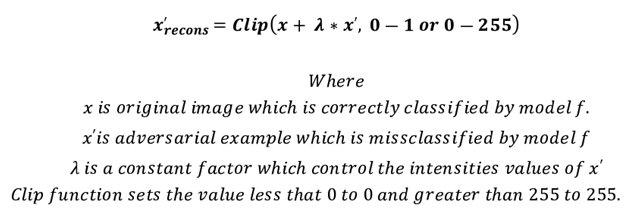

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 10.4658 - accuracy: 0.6700


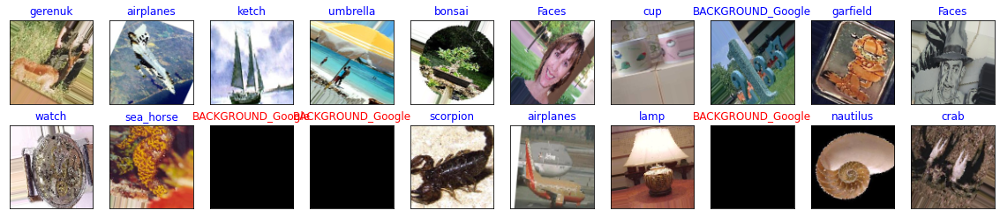

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

# Single Pixel attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.SinglePixelAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 6ms/step - loss: 766.7823 - accuracy: 0.0000e+00

Model accuraccy on Adversarial Example:  0.0 %
Model loss on Adversarial Example:  766.78


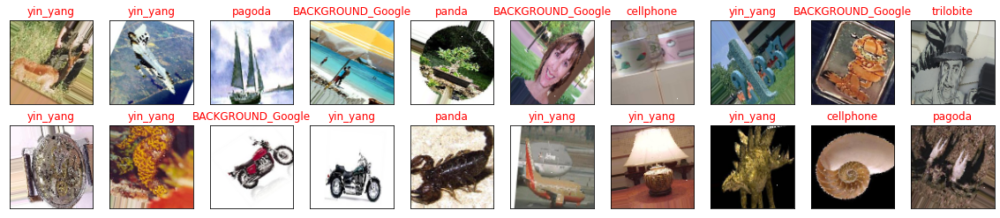

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

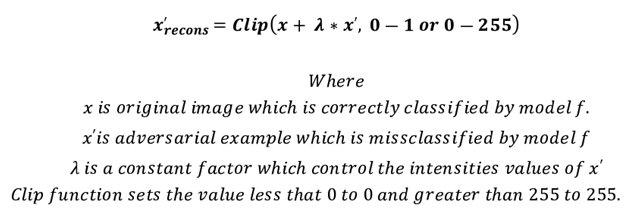

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.0510 - accuracy: 0.9800


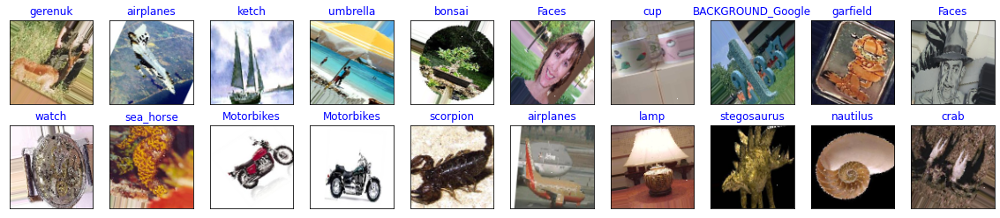

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

# Spatial attack and Reconstruction of Adverasarial Examples

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.SpatialAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 7ms/step - loss: 16.9613 - accuracy: 0.0200

Model accuraccy on Adversarial Example:  0.02 %
Model loss on Adversarial Example:  16.96


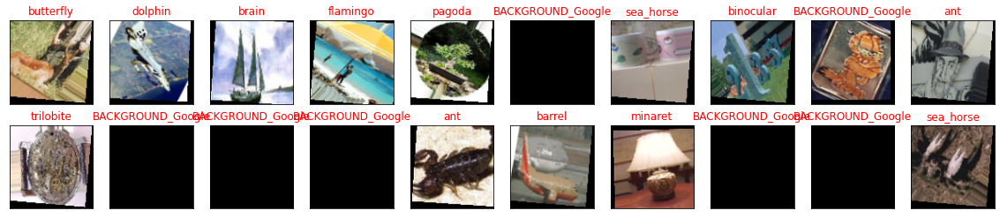

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

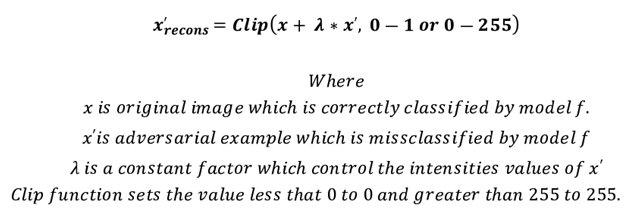

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 7ms/step - loss: 14.9466 - accuracy: 0.5200


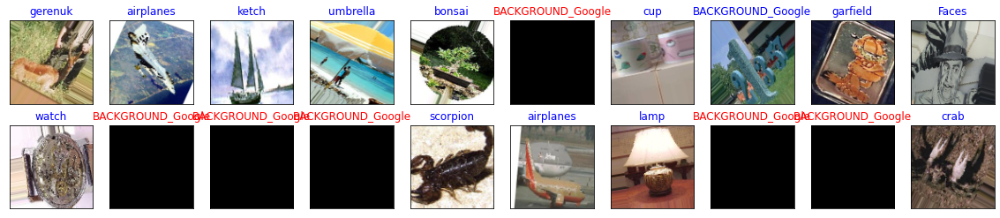

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

In [ ]:
predictions = model.predict(x_test)
# create fool model
fmodel = foolbox.models.KerasModel(model = model, bounds = (0, 255))

# create criteria and distnce of adversarial example
c = foolbox.criteria.Misclassification()
d = foolbox.distances.Linfinity

# create attack
attack = foolbox.attacks.SinglePixelAttack(model = fmodel, criterion = c, distance = d)

# create adversarial examples
adv_examples = []

for idx in np.arange(len(x_test)):
  y_pred = np.argmax(predictions[idx])
  l = y_pred.reshape(1)
  adv = None
  adv = attack(inputs = x_test[idx].reshape(1, 100, 100, 3), labels = l)
  if adv is None:
    print('Warning: Unable to find adversarial example for image at index: ', idx)
  adv_examples.append(adv)



In [ ]:
# convert adv_examples list into numpy array
adv_examples = np.asarray(adv_examples)

adv_examples = adv_examples.reshape(100, 100, 100, 3)
# evaluate the loss and accuracy of our model on adversarial examples.
loss, accuracy = model.evaluate(adv_examples, y_test)

print()
print("Model accuraccy on Adversarial Example: ", round(accuracy, 2), "%")
print("Model loss on Adversarial Example: ", round(loss, 2))

4/4 [==============================] - 0s 6ms/step - loss: 766.7823 - accuracy: 0.0000e+00

Model accuraccy on Adversarial Example:  0.0 %
Model loss on Adversarial Example:  766.78


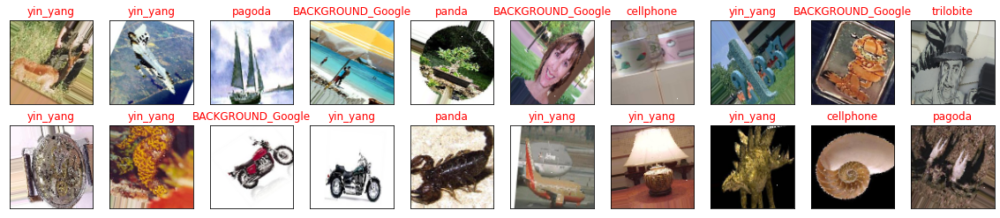

In [ ]:
# predict some adversarial example
predictions = model.predict(adv_examples)


# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_examples[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)

**Reconstruction of Adversarila Examples**

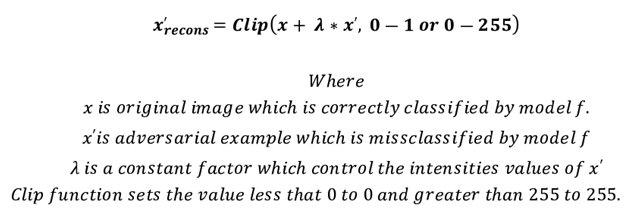

In [ ]:
# take original images
x = x_test

# take adversarial 
x_adv = adv_examples

# take lamda to control the instensities
lambda_ = 0.003

adv_example_recons = []

# lets start reconstruct
for idx in np.arange(len(x_adv)):
  adv_recons = x[idx] + lambda_* x_adv[idx]
  adv_example_recons.append(adv_recons)

# convert from list to numpy array
adv_example_recons = np.asarray(adv_example_recons)

**Test reconstructed adversarial example by model to check its Accuracy and Loss**

In [ ]:
# applying our model on reconstructed adversarial examples
loss, accuracy = model.evaluate(adv_example_recons, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.0510 - accuracy: 0.9800


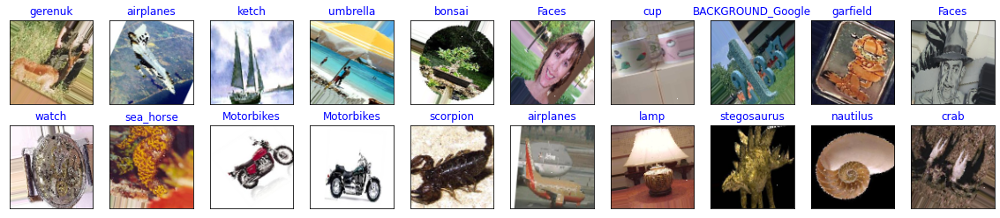

In [ ]:
# predict some testing images
predictions = model.predict(adv_example_recons)

# show test images
fig = plt.figure(figsize = (20, 4))
for idx in range(20):
  ax = fig.add_subplot(2, 10, idx + 1, xticks = [], yticks = [])
  plt.imshow(np.clip(adv_example_recons[idx], 0, 1))
  
  if class_names[np.argmax(y_test[idx])] == class_names[np.argmax(predictions[idx])]:
    color = 'blue'
  else:
    color = 'red'

  plt.title(class_names[np.argmax(predictions[idx])], color = color)